In [1]:
# cek ketersediaan dataset
!dir "D:/Datasets/thesis_dr/aptos2019/"

 Volume in drive D is Storage space
 Volume Serial Number is 3C35-EA61

 Directory of D:\Datasets\thesis_dr\aptos2019

01/07/2021  06:43 AM    <DIR>          .
01/07/2021  06:43 AM    <DIR>          ..
12/18/2019  03:27 AM            54,948 aptos_train.csv
03/20/2020  10:02 AM               124 desktop.ini
12/06/2020  07:57 AM         1,235,300 df_train_dhash - Copy.csv
12/26/2020  12:59 PM           702,068 df_train_dhash - Copy.xlsx
12/06/2020  07:57 AM         1,235,300 df_train_dhash.csv
01/15/2021  10:30 PM    <DIR>          models
01/04/2021  07:50 PM    <DIR>          models - Copy
12/21/2020  07:33 AM    30,245,087,887 models.7z
01/07/2021  12:14 PM    <DIR>          models_alpha
01/06/2021  10:12 AM    <DIR>          models_without_l2
12/18/2019  03:23 AM            28,938 sample_submission.csv
12/17/2020  02:28 PM            25,072 test.csv
10/10/2020  08:35 AM    <DIR>          test_images
12/17/2020  02:28 PM            54,948 train.csv
01/06/2021  11:23 PM    <DIR>        

# BASIC EDA

Dataset merupakan citra fundus retina pasien diabetic retinopathy yang diambil dari kaggle.com. Dataset tersebut disertai dengan file trainLabels.cvs yang berisi label dari citra dataset training.

Pada bagian ini saya akan coba memvisulisasikan karakteristik dataset training yang digunakan dari file cvs yang diberikan. Visualisasi akan menggunakan library pandas, seaborn, dan matplotlib.

Adapun tahapan yang akan dilakukan adalah:
1. Melihat label dataset (file csv) yang kita miliki dan melakukan transformasi pada label dataset tersebut agar siap untuk dibuat grafiknya.
2. Menampilkan visualisasi sederhana menggunakan default dari library pandas.
3. Melakukan penyesuaian untuk membuat visualisasi yang lebih baik dengan memanfaatkan matplotlib

In [2]:
# import library
import numpy as np
import pandas as pd
import os

import seaborn as sns
import matplotlib.pyplot as plt
from os import listdir
from PIL import Image

In [3]:
dir_base = "D:/Datasets/thesis_dr/aptos2019/"
dir_img = os.path.join(dir_base, 'train_images/')

In [4]:
# membuat dataframe
df_label = pd.read_csv(os.path.join(dir_base, 'df_train_dhash.csv'))
df_label_ori = pd.read_csv(os.path.join(dir_base, 'df_train_dhash.csv'))

In [5]:
df_label = df_label.loc[(df_label['keep'] == 'yes') & (df_label['is_exist'] == True),
            ['id_code', 'diagnosis']].reset_index(drop=True)
df_label['id_code'] = df_label['id_code'].str.replace('.png', '')
df_label

,id_code,diagnosis
0,000c1434d8d7,2
1,001639a390f0,4
2,0024cdab0c1e,1
3,002c21358ce6,0
4,005b95c28852,0
...,...,...
3493,ffa47f6a7bf4,2
3494,ffc04fed30e6,0
3495,ffcf7b45f213,2
3496,ffd97f8cd5aa,0


In [6]:
df_label_ori = df_label_ori.loc[(df_label_ori['keep'] == 'yes') & (df_label_ori['is_exist'] == True),
            ['id_code', 'diagnosis']].reset_index(drop=True)
df_label_ori['id_code'] = df_label_ori['id_code'].str.replace('.png', '')
df_label_ori

,id_code,diagnosis
0,000c1434d8d7,2
1,001639a390f0,4
2,0024cdab0c1e,1
3,002c21358ce6,0
4,005b95c28852,0
...,...,...
3493,ffa47f6a7bf4,2
3494,ffc04fed30e6,0
3495,ffcf7b45f213,2
3496,ffd97f8cd5aa,0


In [7]:
df_label.head()

,id_code,diagnosis
0,000c1434d8d7,2
1,001639a390f0,4
2,0024cdab0c1e,1
3,002c21358ce6,0
4,005b95c28852,0


In [8]:
df_label.count()

id_code      3498
diagnosis    3498
dtype: int64

In [9]:
df_label.rename(columns={
    'id_code': 'image',
    'diagnosis': 'level'
},
                inplace=True)

In [10]:
df_label = df_label.replace({
    'level': {
        0: '0 - No DR',
        1: '1 - Mild DR',
        2: '2 - Moderate DR',
        3: '3 - Sever DR',
        4: '4 - PDR'
    }
})

In [11]:
# dataframe df_char1
df_chart1 = df_label.groupby('level')['image'].count().reset_index()
df_chart1.rename(columns={'level': 'DR_level'}, inplace=True)
df_chart1

,DR_level,image
0,0 - No DR,1796
1,1 - Mild DR,338
2,2 - Moderate DR,921
3,3 - Sever DR,173
4,4 - PDR,270


In [12]:
sns.set(style="whitegrid")
# plt.style.use('dark_background')

# IMAGE QUANTITY BY ITS CLASS

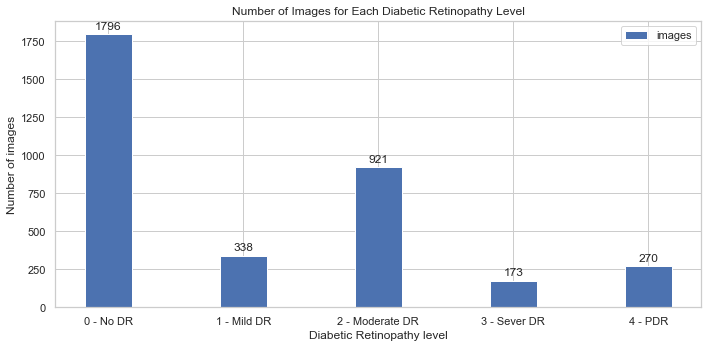

In [13]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

labels = df_chart1['DR_level']
images = df_chart1['image']

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots(figsize=(10, 5))
rects = ax.bar(x, images, width, label='images')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_title('Number of Images for Each Diabetic Retinopathy Level')
ax.set_ylabel('Number of images')
ax.set_xlabel('Diabetic Retinopathy level')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()


def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate(
            '{}'.format(height),
            xy=(rect.get_x() + rect.get_width() / 2, height),
            xytext=(0, 3),  # 3 points vertical offset
            textcoords="offset points",
            ha='center',
            va='bottom')


autolabel(rects)

fig.tight_layout()
plt.show()

In [14]:
df_chart1.count

<bound method DataFrame.count of           DR_level  image
0        0 - No DR   1796
1      1 - Mild DR    338
2  2 - Moderate DR    921
3     3 - Sever DR    173
4          4 - PDR    270>

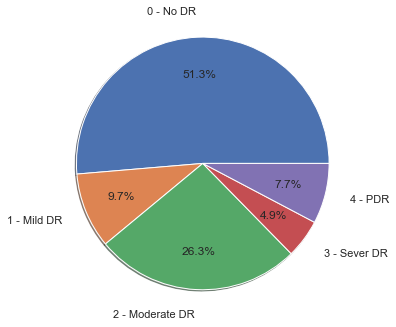

In [15]:
import matplotlib.pyplot as plt

# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels = df_chart1['DR_level']
images = df_chart1['image']

fig1, ax1 = plt.subplots(figsize=(5, 5))
ax1.pie(images,
        labels=labels,
        autopct='%1.1f%%',
        shadow=True,
        startangle=0,
        counterclock=True,
        radius=2,
        pctdistance=0.7,
        labeldistance=1.2)

ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

# IMAGE VISUALIZATION BY ITS CLASS

In [16]:
# define paths to train and test images
TRAIN_IMG_PATH = os.path.join(dir_base, 'train_images')
TEST_IMG_PATH = os.path.join(dir_base, 'test_images')


# function to plot a grid of images
def view_fundus_images(images, title=''):
    """
    Function to plot grid with several examples of fundus images.
    INPUT:
        train - array with filenames for images and condition labels

    OUTPUT: None
    """
    width = 5
    height = 2
    fig, axs = plt.subplots(height, width, figsize=(15, 5))

    for im in range(0, height * width):
        # open image
        image = Image.open(os.path.join(TRAIN_IMG_PATH, images[im] + '.png'))
        i = im // width
        j = im % width
        axs[i, j].imshow(image)  #plot the data
        axs[i, j].axis('off')

    # set suptitle
    plt.suptitle(title)
    plt.show()

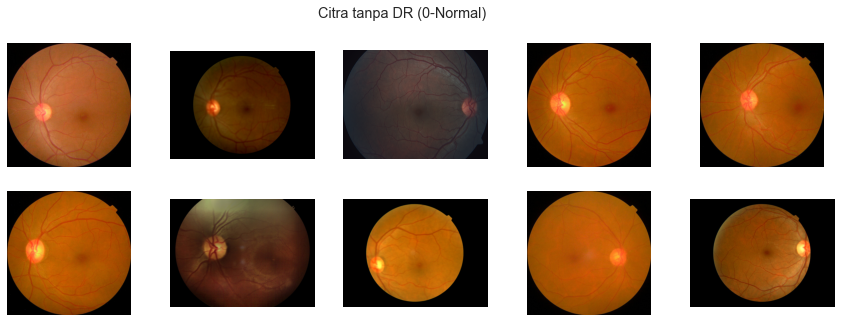

In [17]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 0][:10].id_code.values,
    title='Citra tanpa DR (0-Normal)')

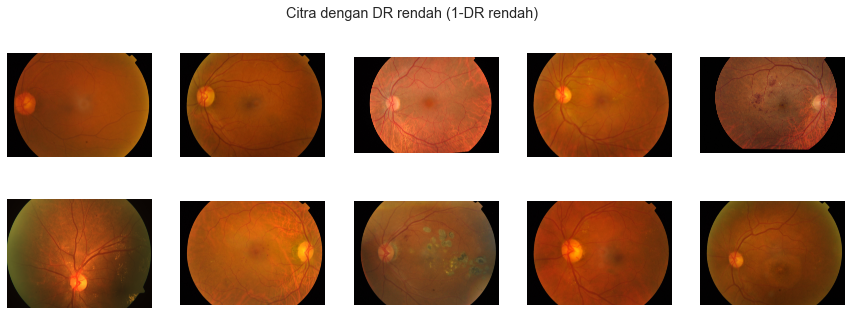

In [18]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 1][:10].id_code.values,
    title='Citra dengan DR rendah (1-DR rendah)')

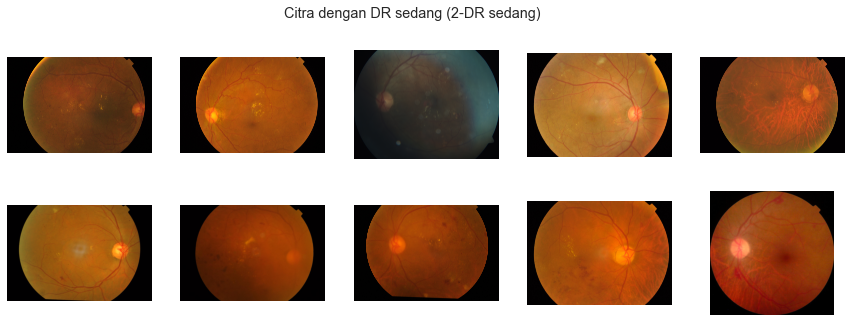

In [19]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 2][:10].id_code.values,
    title='Citra dengan DR sedang (2-DR sedang)')

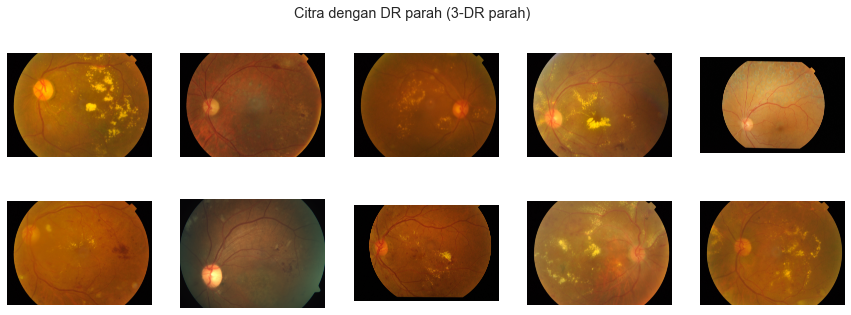

In [20]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 3][:10].id_code.values,
    title='Citra dengan DR parah (3-DR parah)')

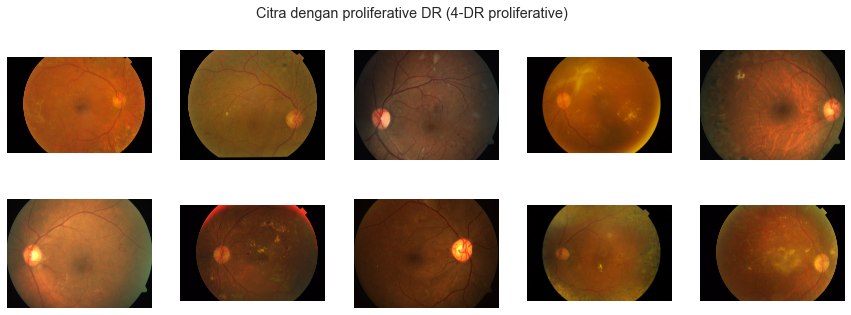

In [21]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 4][:10].id_code.values,
    title='Citra dengan proliferative DR (4-DR proliferative)')

# CHECK SIZE VARIANT

In [22]:
def get_image_sizes(df, train=True):
    '''
    Function to get sizes of images from test and train sets.
    INPUT:
        df - dataframe containing image filenames
        train - indicates whether we are getting sizes of images from train or test set
    '''
    if train:
        path = TRAIN_IMG_PATH
    else:
        path = TEST_IMG_PATH

    widths = []
    heights = []

    images = df.id_code

    max_im = Image.open(os.path.join(path, images[0] + '.png'))
    min_im = Image.open(os.path.join(path, images[0] + '.png'))

    for im in range(0, len(images)):
        image = Image.open(os.path.join(path, images[im] + '.png'))
        width, height = image.size

        if len(widths) > 0:
            if width > max(widths):
                max_im = image

            if width < min(widths):
                min_im = image

        widths.append(width)
        heights.append(height)

    return widths, heights, max_im, min_im

In [23]:
train_widths, train_heights, max_train, min_train = get_image_sizes(
    df_label_ori, train=True)

In [24]:
print('Maximum width for training set is {}'.format(max(train_widths)))
print('Minimum width for training set is {}'.format(min(train_widths)))
print('Maximum height for training set is {}'.format(max(train_heights)))
print('Minimum height for training set is {}'.format(min(train_heights)))

Maximum width for training set is 4288
Minimum width for training set is 474
Maximum height for training set is 2848
Minimum height for training set is 358


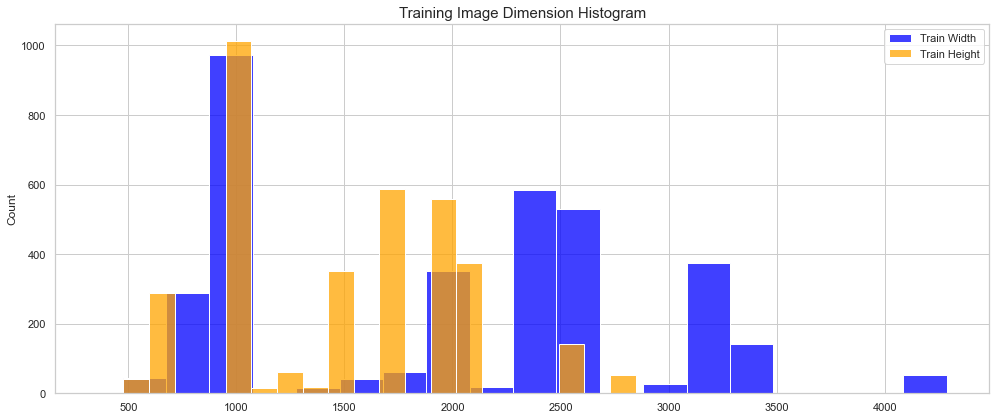

In [25]:
# Plot Histograms and KDE plots for images from the training set
# Source: https://www.kaggle.com/chewzy/eda-weird-images-with-new-updates
plt.figure(figsize=(14, 6))
# plt.subplot(121)
sns.histplot(train_widths, kde=False, label='Train Width', color="blue")
sns.histplot(train_heights, kde=False, label='Train Height', color="orange")
plt.legend()
plt.title('Training Image Dimension Histogram', fontsize=15)

# plt.subplot(122)
# sns.kdeplot(train_widths, label='Train Width', color="blue")
# sns.kdeplot(train_heights, label='Train Height', color="orange")
# plt.legend()
# plt.title('Train Image Dimension KDE Plot', fontsize=15)

plt.tight_layout()
plt.show()

# INSIGHT

Just glancing through various images we can say:
* Images are of different sizes. Height and width ratio varies. That is why __image cropping or padding is required__.
* Pictures are taken with various scales. __Random cropping__ augmentation is required.
* Lighting and colors vary greately. Augmentations which __adjust brightness and color scales__ are required.

# REFERENCE

- https://matplotlib.org/3.2.1/gallery/lines_bars_and_markers/barchart.html#sphx-glr-gallery-lines-bars-and-markers-barchart-py
- https://matplotlib.org/3.2.1/gallery/pie_and_polar_charts/pie_features.html#sphx-glr-gallery-pie-and-polar-charts-pie-features-py
- https://seaborn.pydata.org/generated/seaborn.barplot.html
- https://www.kaggle.com/aleksandradeis/aptos2019-blindness-detection-eda

# Rescale

In [26]:
TRAIN_IMG_PATH = os.path.join(dir_base, 'train_images_300/train_images_rescaled_300/')

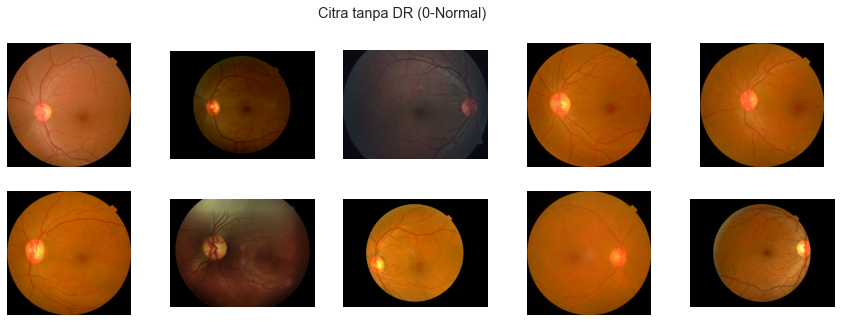

In [27]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 0][:10].id_code.values,
    title='Citra tanpa DR (0-Normal)')

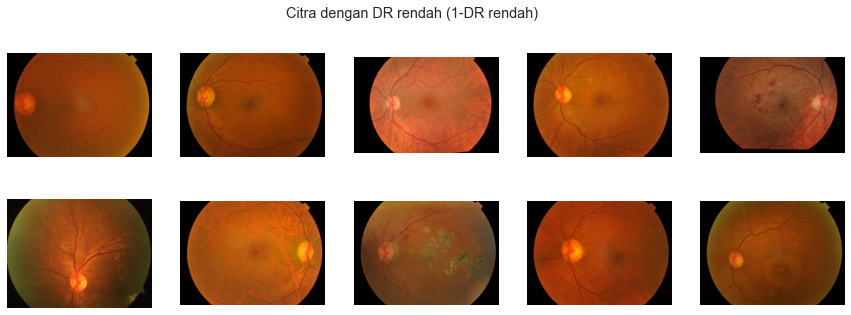

In [28]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 1][:10].id_code.values,
    title='Citra dengan DR rendah (1-DR rendah)')

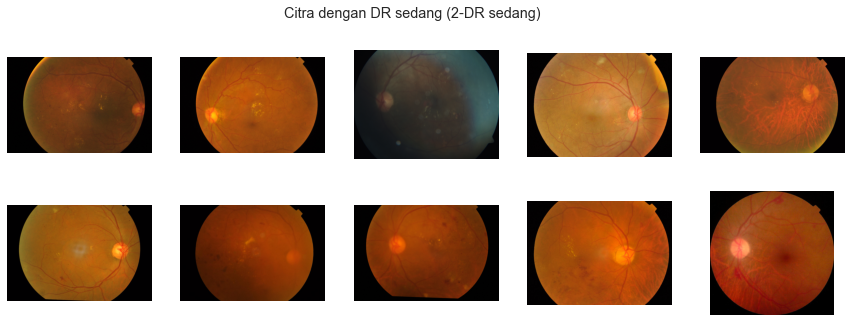

In [29]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 2][:10].id_code.values,
    title='Citra dengan DR sedang (2-DR sedang)')

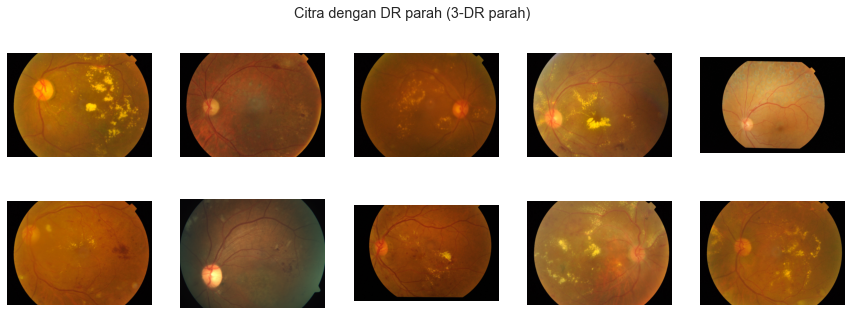

In [30]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 3][:10].id_code.values,
    title='Citra dengan DR parah (3-DR parah)')

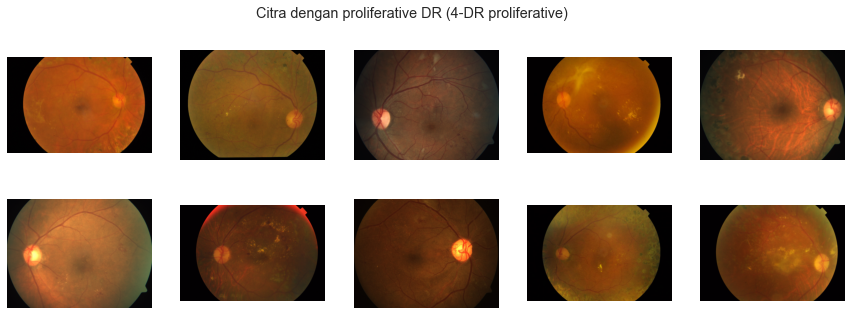

In [31]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 4][:10].id_code.values,
    title='Citra dengan proliferative DR (4-DR proliferative)')

In [32]:
train_widths, train_heights, max_train, min_train = get_image_sizes(
    df_label_ori, train=True)

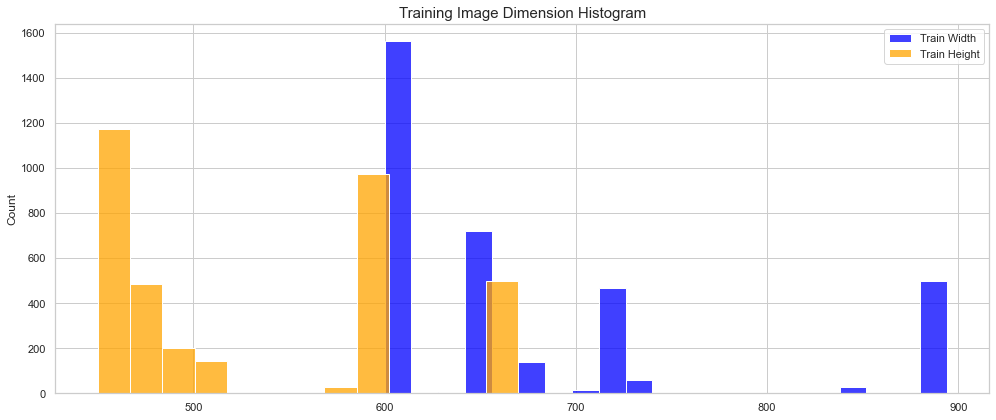

In [33]:
plt.figure(figsize=(14, 6))
sns.histplot(train_widths, kde=False, label='Train Width', color="blue")
sns.histplot(train_heights, kde=False, label='Train Height', color="orange")
plt.legend()
plt.title('Training Image Dimension Histogram', fontsize=15)

plt.tight_layout()
plt.show()

# Graham

In [34]:
TRAIN_IMG_PATH = os.path.join(dir_base, 'train_images_300/train_images_rescaled_300_btgraham/')

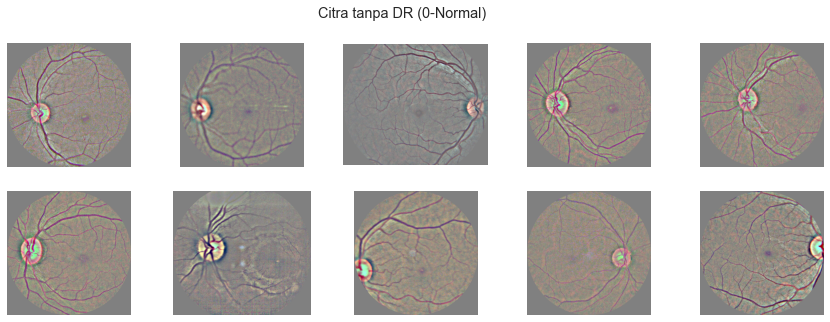

In [35]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 0][:10].id_code.values,
    title='Citra tanpa DR (0-Normal)')

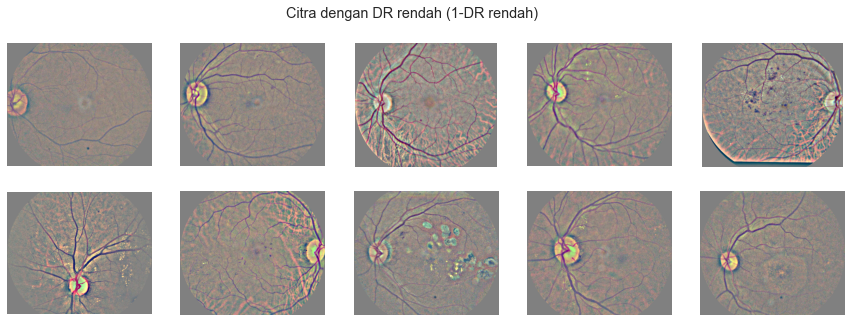

In [36]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 1][:10].id_code.values,
    title='Citra dengan DR rendah (1-DR rendah)')

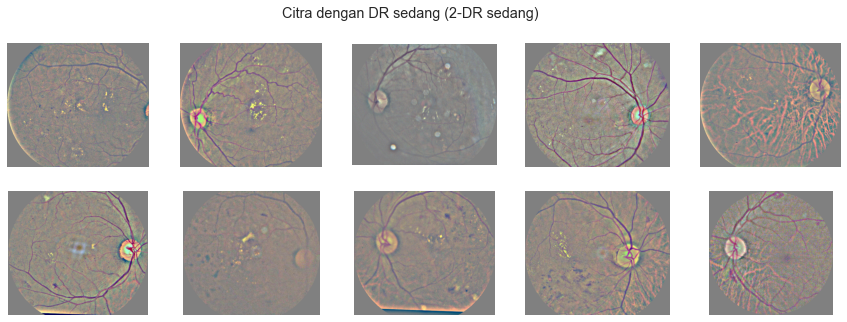

In [37]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 2][:10].id_code.values,
    title='Citra dengan DR sedang (2-DR sedang)')

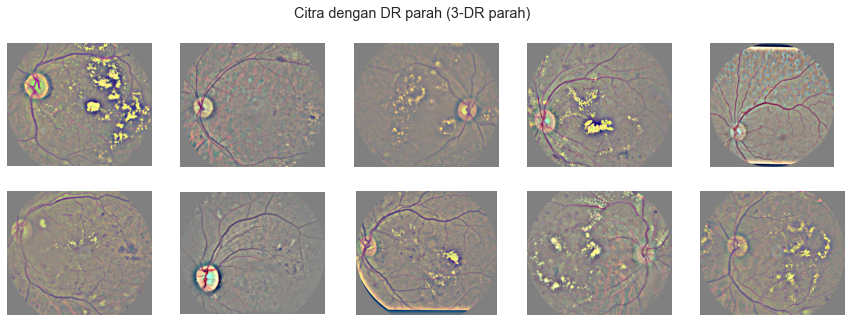

In [38]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 3][:10].id_code.values,
    title='Citra dengan DR parah (3-DR parah)')

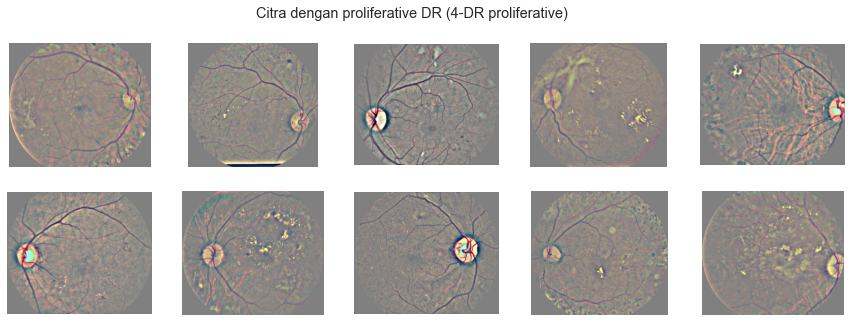

In [39]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 4][:10].id_code.values,
    title='Citra dengan proliferative DR (4-DR proliferative)')

In [40]:
train_widths, train_heights, max_train, min_train = get_image_sizes(
    df_label_ori, train=True)

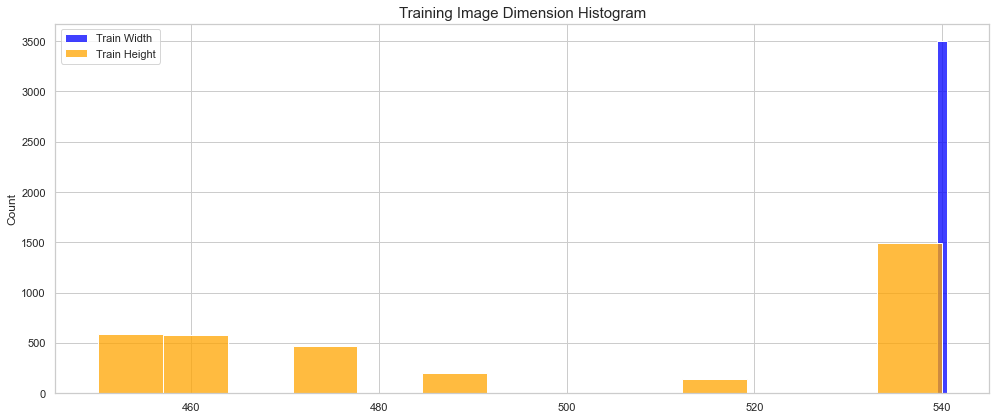

In [41]:
plt.figure(figsize=(14, 6))
sns.histplot(train_widths, kde=False, label='Train Width', color="blue")
sns.histplot(train_heights, kde=False, label='Train Height', color="orange")
plt.legend()
plt.title('Training Image Dimension Histogram', fontsize=15)

plt.tight_layout()
plt.show()

# Nakhon

In [42]:
TRAIN_IMG_PATH = os.path.join(dir_base, 'train_images_300/train_images_rescaled_300_nakhon/')

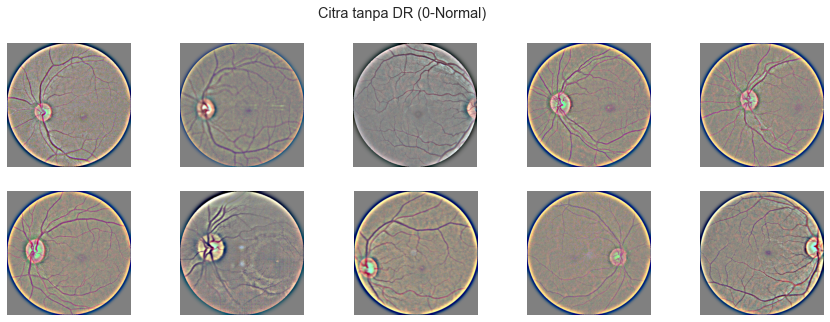

In [43]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 0][:10].id_code.values,
    title='Citra tanpa DR (0-Normal)')

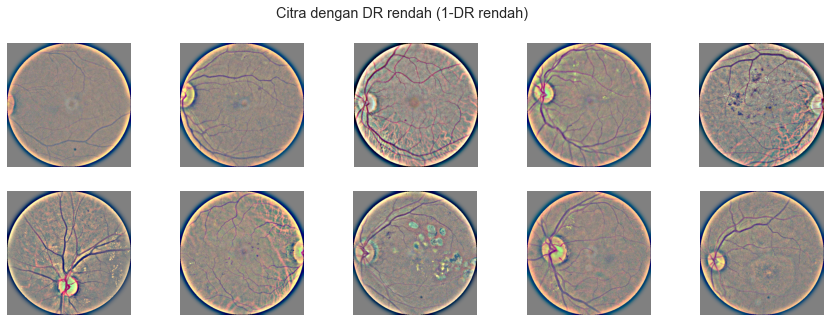

In [44]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 1][:10].id_code.values,
    title='Citra dengan DR rendah (1-DR rendah)')

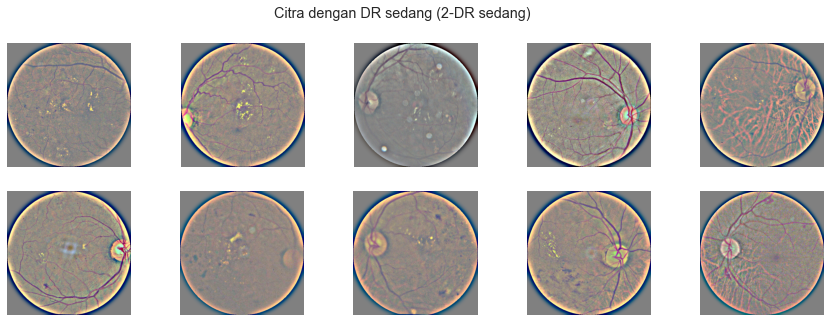

In [45]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 2][:10].id_code.values,
    title='Citra dengan DR sedang (2-DR sedang)')

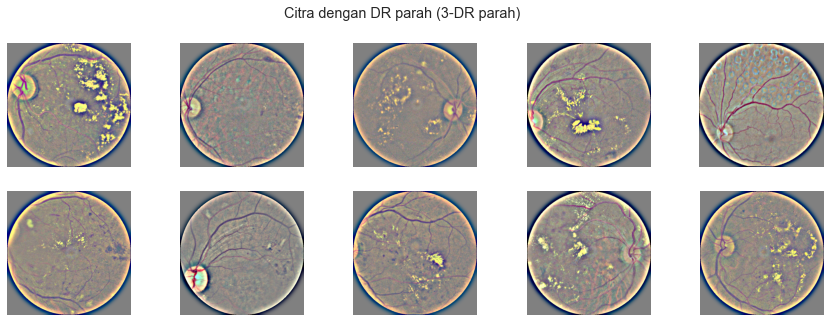

In [46]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 3][:10].id_code.values,
    title='Citra dengan DR parah (3-DR parah)')

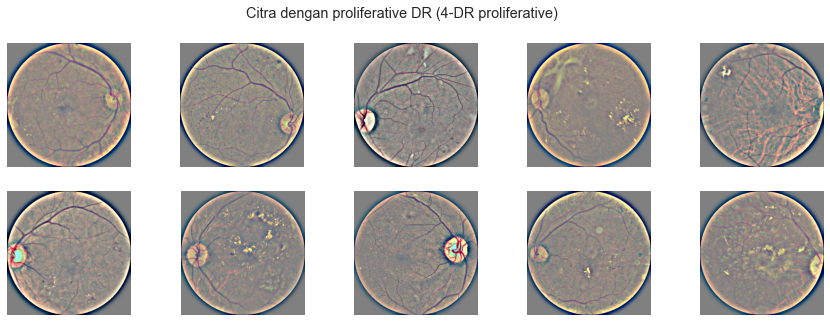

In [47]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 4][:10].id_code.values,
    title='Citra dengan proliferative DR (4-DR proliferative)')

In [48]:
train_widths, train_heights, max_train, min_train = get_image_sizes(
    df_label_ori, train=True)

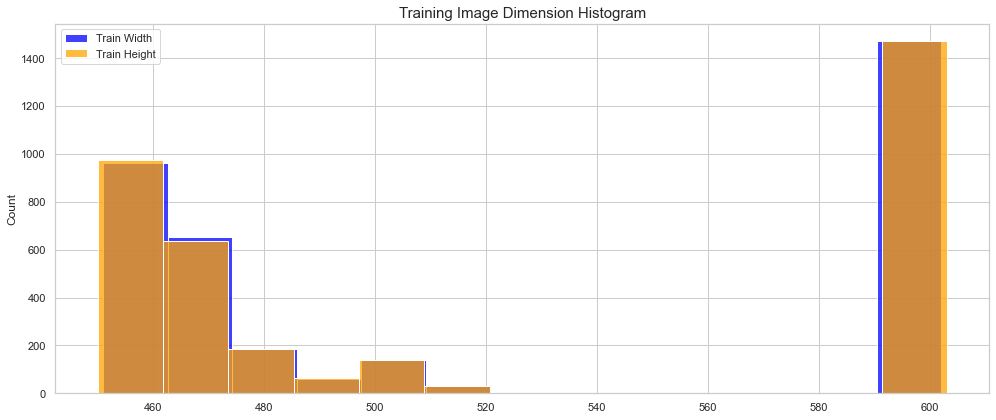

In [49]:
plt.figure(figsize=(14, 6))
sns.histplot(train_widths, kde=False, label='Train Width', color="blue")
sns.histplot(train_heights, kde=False, label='Train Height', color="orange")
plt.legend()
plt.title('Training Image Dimension Histogram', fontsize=15)

plt.tight_layout()
plt.show()

# Green

In [50]:
TRAIN_IMG_PATH = os.path.join(dir_base, 'train_images_300/train_images_rescaled_300_enhanced_green_crop_nakhon/')

In [51]:
plt.rcParams['image.cmap'] = 'gray'

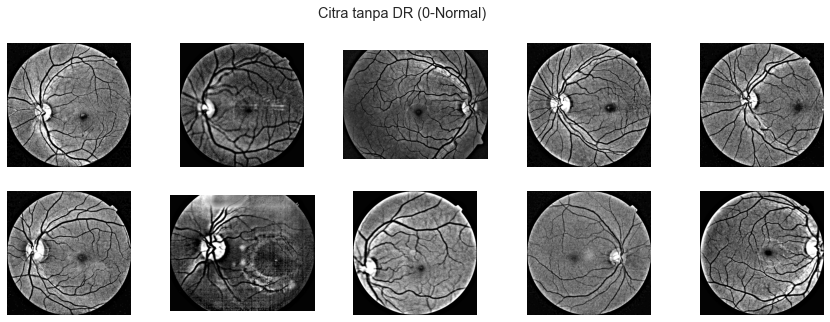

In [52]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 0][:10].id_code.values,
    title='Citra tanpa DR (0-Normal)')

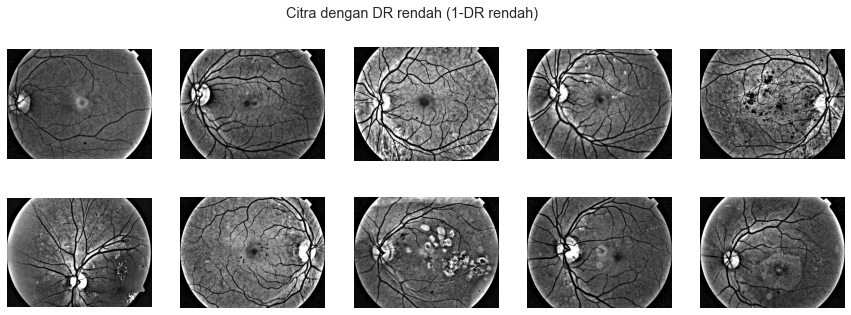

In [53]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 1][:10].id_code.values,
    title='Citra dengan DR rendah (1-DR rendah)')

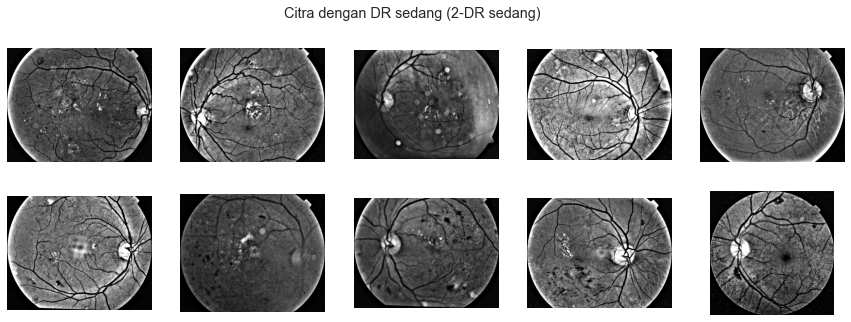

In [54]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 2][:10].id_code.values,
    title='Citra dengan DR sedang (2-DR sedang)')

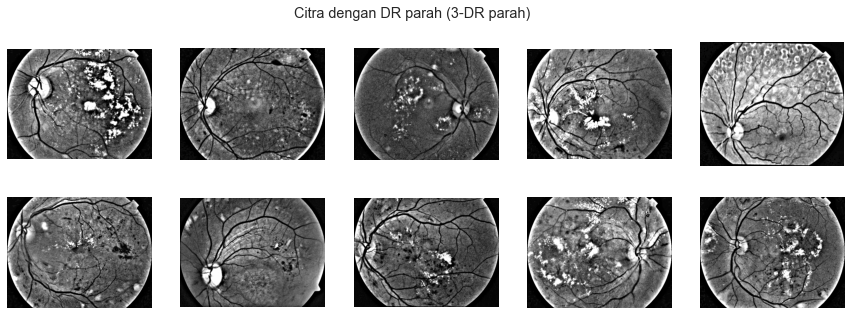

In [55]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 3][:10].id_code.values,
    title='Citra dengan DR parah (3-DR parah)')

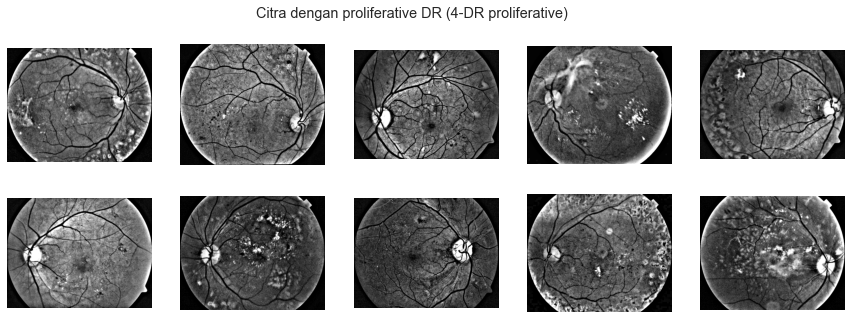

In [56]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 4][:10].id_code.values,
    title='Citra dengan proliferative DR (4-DR proliferative)')

In [57]:
train_widths, train_heights, max_train, min_train = get_image_sizes(
    df_label_ori, train=True)

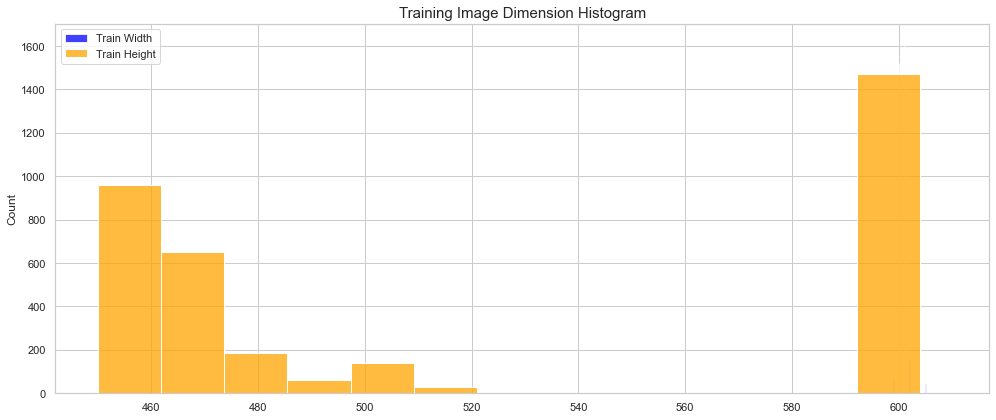

In [58]:
plt.figure(figsize=(14, 6))
sns.histplot(train_widths, kde=False, label='Train Width', color="blue")
sns.histplot(train_heights, kde=False, label='Train Height', color="orange")
plt.legend()
plt.title('Training Image Dimension Histogram', fontsize=15)

plt.tight_layout()
plt.show()

# Ramasubramanian

In [59]:
TRAIN_IMG_PATH = os.path.join(dir_base, 'train_images_300/rescaled_300_crop_ramasubramanian/')

In [60]:
plt.rcParams['image.cmap'] = 'gray'

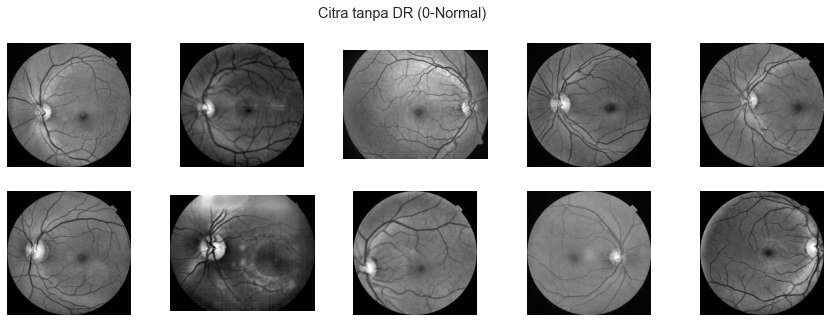

In [61]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 0][:10].id_code.values,
    title='Citra tanpa DR (0-Normal)')

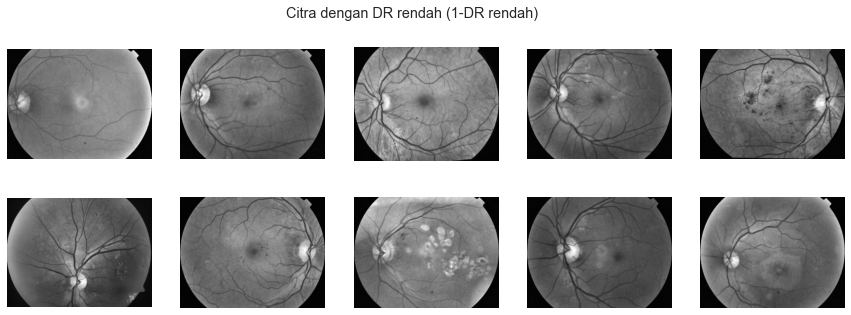

In [62]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 1][:10].id_code.values,
    title='Citra dengan DR rendah (1-DR rendah)')

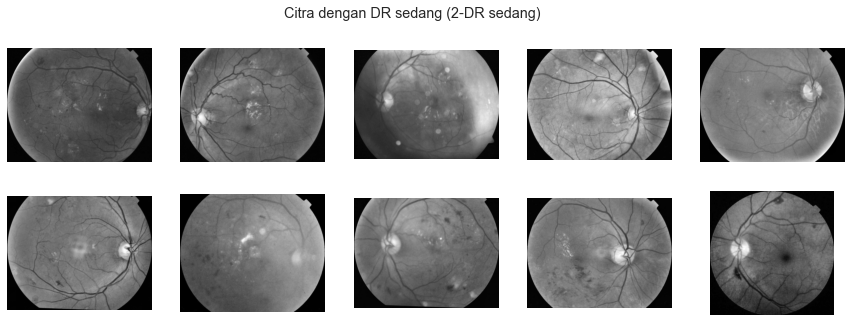

In [63]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 2][:10].id_code.values,
    title='Citra dengan DR sedang (2-DR sedang)')

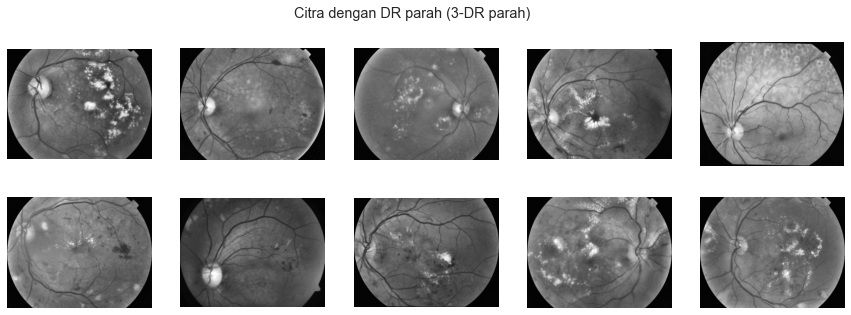

In [64]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 3][:10].id_code.values,
    title='Citra dengan DR parah (3-DR parah)')

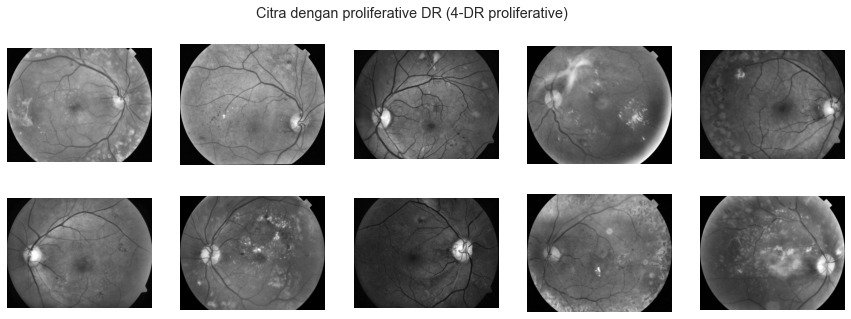

In [65]:
view_fundus_images(
    df_label_ori[df_label_ori['diagnosis'] == 4][:10].id_code.values,
    title='Citra dengan proliferative DR (4-DR proliferative)')

In [66]:
train_widths, train_heights, max_train, min_train = get_image_sizes(
    df_label_ori, train=True)

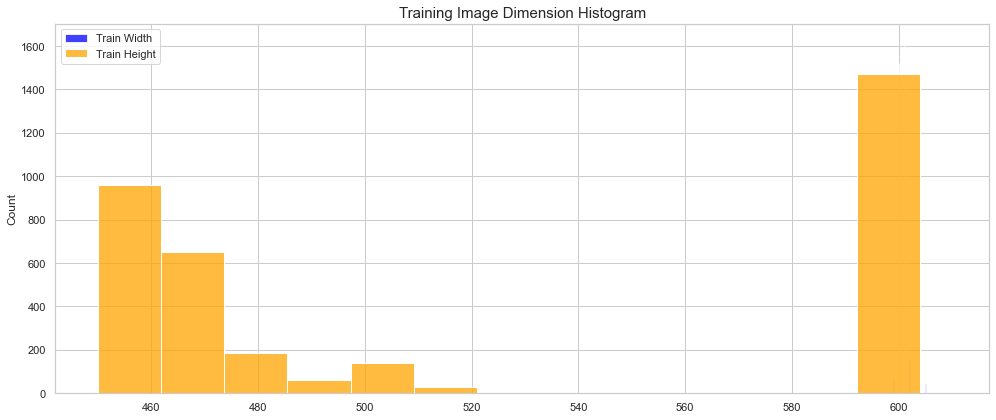

In [67]:
plt.figure(figsize=(14, 6))
sns.histplot(train_widths, kde=False, label='Train Width', color="blue")
sns.histplot(train_heights, kde=False, label='Train Height', color="orange")
plt.legend()
plt.title('Training Image Dimension Histogram', fontsize=15)

plt.tight_layout()
plt.show()